In [1]:
import requests
from bs4 import BeautifulSoup as bs
import pandas as pd
import time
import re
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV

from selenium import webdriver
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By
from selenium.common.exceptions import TimeoutException

In [2]:
#check if website is scrapable
import requests
url='https://www.basketball-reference.com/robots.txt'
response=requests.get(url)
print(response.text)

User-agent: AhrefsBot
Disallow: /

User-agent: Twitterbot
Disallow:

User-agent: *
Disallow: /blazers/
Disallow: /dump/
Disallow: /fc/
Disallow: /my/
Disallow: /7103
Disallow: /play-index/*.cgi?*
Disallow: /play-index/plus/*.cgi?*
Disallow: */gamelog/
Disallow: */splits/
Disallow: */on-off/
Disallow: */lineups/
Disallow: */shooting/

Disallow: /req/
Disallow: /short/
Disallow: /nocdn/

Crawl-delay: 3

# Disallow the plagiarism.org robot, www.slysearch.com
User-agent: SlySearch
User-agent: GroundControl
User-agent: Ground-Control
User-agent: Carmine
User-agent: Skynet
User-agent: The-Matrix
User-agent: Matrix
User-agent: HAL9000
Disallow: /            #Will disallow or robot from all urls on your site




In [2]:
#get basketball data
url = 'https://www.basketball-reference.com/wnba/years/2021_advanced.html'
response=requests.get(url)
page=response.text
soup=bs(page)
#print(page[:100])

#https://www.basketball-reference.com/wnba/years/2021_per_minute.html

In [4]:
# get table headers
headers = [th.getText() for th in soup.findAll('tr', limit=2)[0].findAll('th')]
#add Year column
headers.append ('Year') 
headers

['Player',
 'Team',
 'Pos',
 'G',
 'MP',
 'G',
 'MP',
 'PER',
 'TS%',
 'eFG%',
 '3PAr',
 'FTr',
 'ORB%',
 'TRB%',
 'AST%',
 'STL%',
 'BLK%',
 'TOV%',
 'USG%',
 'ORtg',
 'DRtg',
 '\xa0',
 'OWS',
 'DWS',
 'WS',
 'WS/40',
 'Year']

In [22]:
# get table row data
import random
import time

#years = ['2021','2020','2019','2018','2017','2016']
player_stats=[]
for seas in range(2021,2015,-1): 

    url = 'https://www.basketball-reference.com/wnba/years/%s_advanced.html' %seas
    print(seas)
    response=requests.get(url)
    page=response.text
    soup = bs(page)
    #print(soup)

    rows = soup.findAll('tr')[1:] #exclude column headers

    #player_stats =[]
    for i in range(len(rows)):
        list= []
        for th in rows[i].findAll('th',class_="left"): # find player names
            list.append(th.getText())
        for td in rows[i].findAll('td'): # find stats
            list.append(td.getText())
        list.append(int(seas)) # add year to data
        player_stats.append(list)

    time.sleep(.5+2*random.random())

2021
2020
2019
2018
2017
2016


In [23]:
#create data frame and drop empty rows & add year column
stats = pd.DataFrame(player_stats, columns = headers)
stats.dropna(inplace=True)
stats['Year'] = stats['Year'].astype(int)


In [24]:
#drop empty column
stats.drop(stats.columns[-6], axis=1, inplace=True)
stats.head()

,Player,Team,Pos,G,MP,G,MP,PER,TS%,eFG%,...,BLK%,TOV%,USG%,ORtg,DRtg,OWS,DWS,WS,WS/40,Year
0,Natalie Achonwa,MIN,F,21,253,21,253,13.6,.525,.426,...,1.7,15.1,15.5,108,98,0.4,0.5,0.9,.141,2021
1,Bella Alarie,DAL,C-F,31,407,31,407,14.1,.556,.500,...,4.4,19.8,9.9,113,102,0.6,0.6,1.2,.116,2021
2,Lindsay Allen,IND,G,32,571,32,571,13.6,.517,.474,...,0.4,15.6,15.6,107,113,0.9,-0.2,0.7,.049,2021
3,Rebecca Allen,NYL,F,25,615,25,615,14.3,.493,.454,...,4.0,8.3,18.6,97,101,0.3,0.9,1.2,.075,2021
4,Jillian Alleyne,WAS,C-F,2,8,2,8,6.6,.000,.000,...,0.0,0.0,11.3,35,90,0.0,0.0,0.0,-0.083,2021


In [8]:
#replace accented characters for merge later

import unicodedata

def strip_accents(text):
    try:
        text = unicode(text, 'utf-8')
    except NameError: # unicode is a default on python 3 
        pass

    text = unicodedata.normalize('NFD', text)\
           .encode('ascii', 'ignore')\
           .decode("utf-8")

    return str(text)


In [27]:
#remove special characters
stats['Player']=stats.Player.apply(strip_accents)
stats['Player'] = stats['Player'].map(lambda x: x.replace('.',''))

In [28]:
# if player has a "TOT" team, then remove other rows of stats for that year
# "TOT" always appears first 
stats_TOT =stats.drop_duplicates(['Player','Year'])

#remove duplicated columns
stats_TOT = stats_TOT.loc[:,~stats_TOT.columns.duplicated()]

#change value fieds to float
cols= stats_TOT.columns.drop(['Player','Team','Pos','Year'])
stats_TOT[cols]=stats_TOT[cols].apply(pd.to_numeric)

stats_TOT[stats_TOT['Player']=='Alaina Coates']
#stats_TOT.info()

,Player,Team,Pos,G,MP,PER,TS%,eFG%,3PAr,FTr,...,BLK%,TOV%,USG%,ORtg,DRtg,OWS,DWS,WS,WS/40,Year
219,Alaina Coates,WAS,C,20,197,11.6,0.550,0.529,0.0,0.765,...,1.9,20.9,13.5,105.0,104.0,0.2,0.3,0.5,0.093,2020
522,Alaina Coates,TOT,C,23,167,16.5,0.553,0.533,0.0,0.467,...,5.5,14.2,16.9,107.0,94.0,0.3,0.4,0.7,0.165,2019
566,Alaina Coates,CHI,C,32,364,12.7,0.595,0.568,0.0,0.541,...,1.5,15.7,13.3,116.0,112.0,0.7,0.1,0.8,0.090,2018


In [29]:
stats_TOT.to_pickle ('pickles/df_wnba_adv')

In [13]:
# scrape salary data
url2 = 'https://www.spotrac.com/wnba/rankings/2021/base'
response2=requests.get(url2)
page2=response2.text
soup2 = bs(page2)

In [14]:
# get salary table headers
salary_header=soup2.find('thead').text
salary_header =salary_header.split('\n')
salary_header=[salary_header[index] for index in [3,6]]
salary_header = [x.strip(' ') for x in salary_header]
salary_header.append ('Year')  
salary_header

['Player', 'base', 'Year']

In [15]:
#pull Salary data with Selenium

driver = webdriver.Chrome("/Applications/chromedriver")

# Use Selenium to login and get all cookies 
loginURL = 'https://www.spotrac.com/signin/'
username = 'amyyunekim@yahoo.com'
password = 'Metis123'


driver.get(loginURL)

try:
    # Wait for cookie message
    accept_cookie = WebDriverWait(driver, 5, 0.25).until(EC.visibility_of_element_located([By.CSS_SELECTOR, '.cookie-alert-accept']))
    accept_cookie.click()
    print("Cookies accepted")
except TimeoutException:
    print("no alert")

try:
    # Wait for cookie message

    popup = WebDriverWait(driver, 5, 0.25).until(EC.visibility_of_element_located([By.CSS_SELECTOR, '.cls-btn']))
    popup.click()

except TimeoutException:
    print("timed out")

time.sleep(1)
driver.find_element_by_name("email").send_keys(username)
driver.find_element_by_name("password").send_keys(password)

submit = WebDriverWait(driver, 100).until(EC.visibility_of_element_located((By.XPATH, '//*[@id="contactForm"]/div[2]/input')))
submit.click()
print ('Logged in!')

# Now that the cookies are there, can use requests to iterate through the links
player_salary=[]

for seas in range(2021, 2015, -1):
    print(seas)
    url = 'https://www.spotrac.com/wnba/rankings/%s/base/' %seas

    driver.get(url)

    soup = bs(driver.page_source, 'html.parser')

    for h3 in soup.find_all('h3')[5:-1]: # extract only player info
        #print(h3.text)
        list= []
        list.append(h3.text)
        list.append(h3.find_next(class_="rank-value").text.strip(' '))
        list.append(seas)
        player_salary.append(list)

driver.close()


no alert
timed out
Logged in!
2021
2020
2019
2018
2017
2016


In [27]:
#clean up data
salary = pd.DataFrame(player_salary, columns = salary_header)
salary[['base']] = salary[['base']].replace('[\$,]','',regex=True).astype(int) #remove $signs
salary['Player']=salary.Player.apply(strip_accents) #remove accents


In [28]:
#check updates worked
mask = salary.Player =='Amanda Zahui B'
salary[mask]
salary.shape


(607, 3)

In [32]:
#pickle output
salary.to_pickle('pickles/salary_base')
salary.to_pickle('pickles/salary_avg')


In [34]:
salary_base=pd.read_pickle('pickles/salary_base')
salary_avg=pd.read_pickle('pickles/salary_avg')
merged_salary=pd.merge(left=salary_base, right=salary_avg, how='outer',on = ['Player','Year'])


In [37]:
merged_salary[(merged_salary['base'].isna() )| (merged_salary['average'].isna())]

,Player,base,Year,average
75,Gabby Williams,70040,2021,NaN
224,Aerial Powers,80000,2020,NaN
239,Brionna Jones,68000,2020,NaN
240,Nia Coffey,68000,2020,NaN
247,Allisha Gray,65779,2020,NaN
386,Tanisha Wright,94860,2019,NaN
387,Layshia Clarendon,93400,2019,NaN
403,Breanna Stewart,64538,2019,NaN
404,Rachel Banham,64538,2019,NaN
405,Morgan Tuck,64538,2019,NaN


In [38]:
#df.Col1 = df.Col1.fillna(df.Col2)
merged_salary.average = merged_salary.average.fillna(merged_salary.base)

In [41]:
mask = merged_salary.Player =='Temi Fagbenle'
merged_salary[mask]


,Player,base,Year,average
0,Elena Delle Donne,221450,2021,224870.0
1,DeWanna Bonner,221450,2021,224870.0
2,Skylar Diggins-Smith,221450,2021,224870.0
3,Brittney Griner,221450,2021,221515.0
4,Diana Taurasi,221450,2021,224772.0
...,...,...,...,...
606,Skylar Diggins-Smith,111500,2016,114500.0
607,Candace Parker,111500,2016,115500.0
608,Sue Bird,111500,2016,134600.0
609,Emma Meesseman,111500,2016,85625.0


In [44]:

merged_salary.rename(columns={"average": "salary"},  inplace=True)
merged_salary

,Player,base,Year,salary
0,Elena Delle Donne,221450,2021,224870.0
1,DeWanna Bonner,221450,2021,224870.0
2,Skylar Diggins-Smith,221450,2021,224870.0
3,Brittney Griner,221450,2021,221515.0
4,Diana Taurasi,221450,2021,224772.0
...,...,...,...,...
606,Skylar Diggins-Smith,111500,2016,114500.0
607,Candace Parker,111500,2016,115500.0
608,Sue Bird,111500,2016,134600.0
609,Emma Meesseman,111500,2016,85625.0


In [45]:
merged_salary.to_pickle('pickles/salary')

In [26]:
salary.groupby('Year').max('base')

,base
Year,
2016,111500
2017,113500
2018,115500
2019,127500
2020,215000
2021,221450


In [27]:
#salary cap table from https://herhoopstats.com/wnba_cba_salary_cap_explained
#2016 and 2017 did not have a salary cap in operation, so assumption was used

salary_cap = {
    2016: 942489,
    2017: 959394,
    2018: 976300,
    2019: 996100,
    2020: 1300000,
    2021: 1339000
}
cap_df= pd.DataFrame(salary_cap.items(),columns=['Year','salary_cap'])
cap_df

,Year,salary_cap
0,2016,942489
1,2017,959394
2,2018,976300
3,2019,996100
4,2020,1300000
5,2021,1339000


In [26]:
#merge salary and stats dfs together
df=pd.merge(left=stats_TOT, right=salary,
            how='inner',
            left_on=['Player','Year'], 
            right_on=['Player','Year'])
df=pd.merge(left=df, right = cap_df,
            how='inner',
            on=['Year'])

df.groupby('Year').count()['Player']


Year
2016      5
2017     21
2018     94
2019    145
2020    138
2021    140
Name: Player, dtype: int64

<AxesSubplot:>

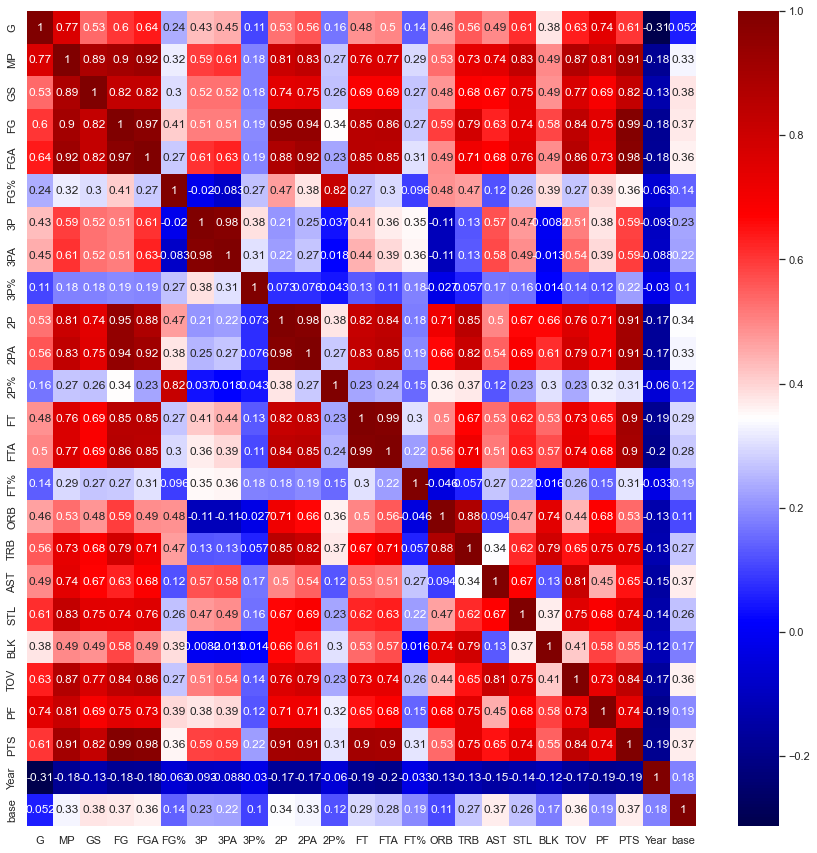

In [106]:
#visualize correlations
sns.heatmap(df.corr(), cmap="seismic",annot=True)

In [120]:
df.corr()

,G,MP,GS,FG,FGA,FG%,3P,3PA,3P%,2P,...,ORB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,base
G,1.000000,0.794190,0.559783,0.652988,0.678194,0.311302,0.438841,0.460853,0.087971,0.596560,...,0.517471,0.606125,0.539016,0.654562,0.397506,0.683557,0.784699,0.650204,-0.206254,0.051730
MP,0.794190,1.000000,0.884607,0.914496,0.928209,0.336613,0.604278,0.618914,0.180352,0.839153,...,0.591961,0.770235,0.765638,0.850254,0.506338,0.885521,0.836488,0.917383,-0.087608,0.330932
GS,0.559783,0.884607,1.000000,0.825659,0.822386,0.297236,0.524613,0.521690,0.178669,0.765128,...,0.536963,0.709151,0.695777,0.753658,0.481028,0.781147,0.709134,0.823965,-0.053389,0.379162
FG,0.652988,0.914496,0.825659,1.000000,0.974860,0.386685,0.556448,0.558322,0.194873,0.954897,...,0.616519,0.799400,0.675261,0.769316,0.572199,0.855029,0.756162,0.988833,-0.068290,0.373418
FGA,0.678194,0.928209,0.822386,0.974860,1.000000,0.276813,0.645341,0.667152,0.189457,0.894123,...,0.527544,0.730325,0.722594,0.787925,0.485743,0.872508,0.741563,0.981188,-0.065521,0.359114
FG%,0.311302,0.336613,0.297236,0.386685,0.276813,1.000000,0.023333,-0.023648,0.310270,0.437130,...,0.449041,0.441003,0.150202,0.263626,0.359183,0.284370,0.398111,0.344791,-0.035581,0.138693
3P,0.438841,0.604278,0.524613,0.556448,0.645341,0.023333,1.000000,0.981133,0.377385,0.284632,...,-0.021633,0.201081,0.594898,0.521551,0.043909,0.547405,0.385535,0.629248,0.036886,0.225897
3PA,0.460853,0.618914,0.521690,0.558322,0.667152,-0.023648,0.981133,1.000000,0.314094,0.293536,...,-0.021638,0.203490,0.606130,0.539481,0.035956,0.571306,0.400407,0.634449,0.034262,0.222471
3P%,0.087971,0.180352,0.178669,0.194873,0.189457,0.310270,0.377385,0.314094,1.000000,0.086593,...,-0.036980,0.058738,0.179393,0.155816,0.017426,0.160295,0.098299,0.217171,0.044618,0.102088
2P,0.596560,0.839153,0.765128,0.954897,0.894123,0.437130,0.284632,0.293536,0.086593,1.000000,...,0.719044,0.850453,0.566486,0.701216,0.644487,0.790868,0.734647,0.915997,-0.091972,0.340544


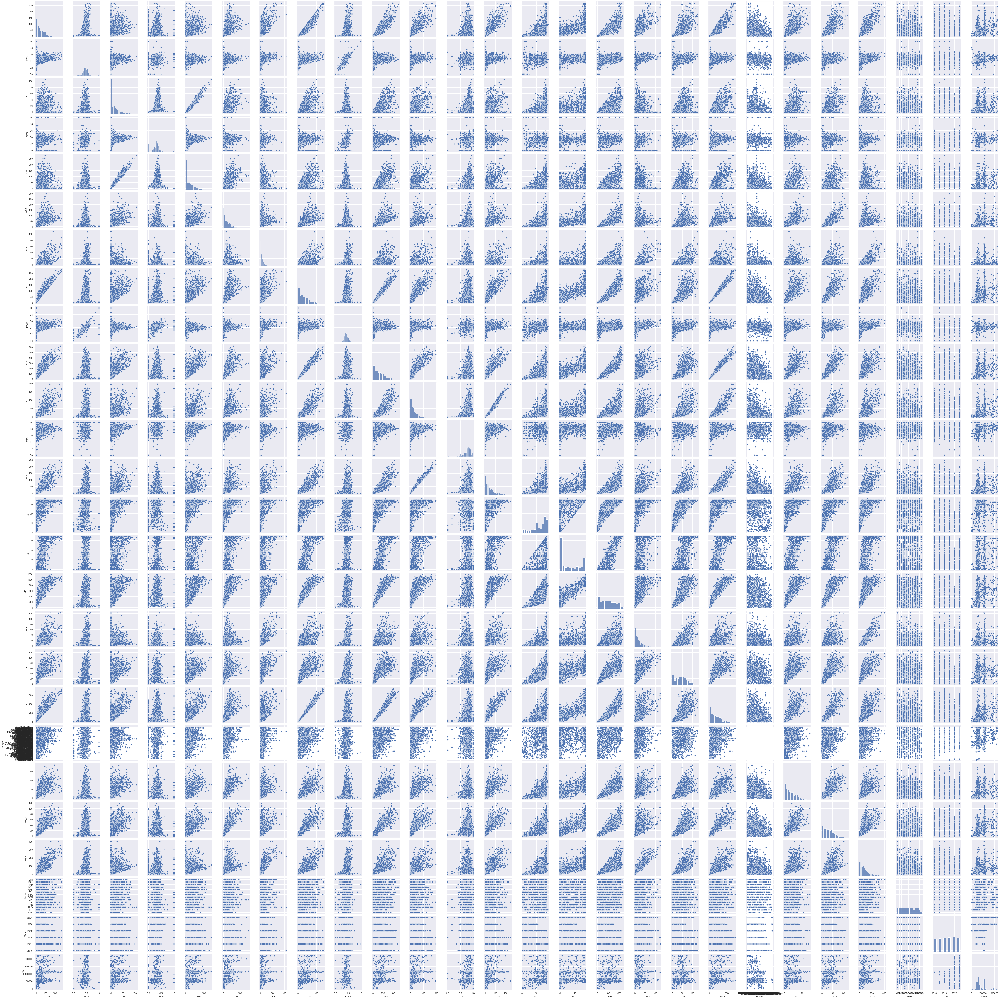

In [121]:
column_names=['2P', '2P%', '3P', '3P%', '3PA', 'AST', 'BLK', 'FG', 'FG%',
       'FGA', 'FT', 'FT%', 'FTA', 'G', 'GS', 'MP', 'ORB', 'PF', 'PTS',
       'Player', 'STL', 'TOV', 'TRB', 'Team', 'Year', 'base']
sns.pairplot(df, vars=['2P', '2P%', '3P', '3P%', '3PA', 'AST', 'BLK', 'FG', 'FG%',
       'FGA', 'FT', 'FT%', 'FTA', 'G', 'GS', 'MP', 'ORB', 'PF', 'PTS',
       'Player', 'STL', 'TOV', 'TRB', 'Team', 'Year', 'base'])

In [ ]:
# Create an empty model
lr = LinearRegression()

# Choose the predictor variables, here all but the first which is the response variable
# This model is analogous to the Y ~ X1 + X2 + X3 + X4 + X5 + X6 model
X = df.iloc[:, 1:]

# Choose the response variable(s)
y = df.iloc[:, 0]

# Fit the model to the full dataset
lr.fit(X, y)

# Print out the R^2 for the model against the full dataset
lr.score(X,y)

In [ ]:

from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = results.model.exog  #results of model i.e. fit
vif=[variance_inflation_factor(variables,i)
for i in range (variables.shape[1])]